## Combine all combinations


## Top 100

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData"


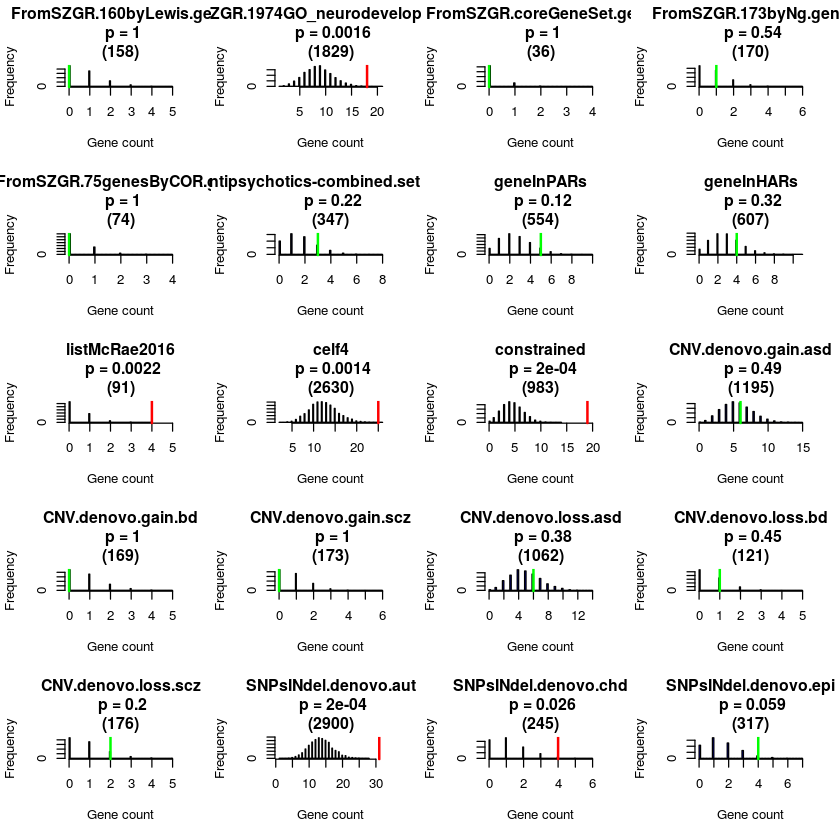

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData"


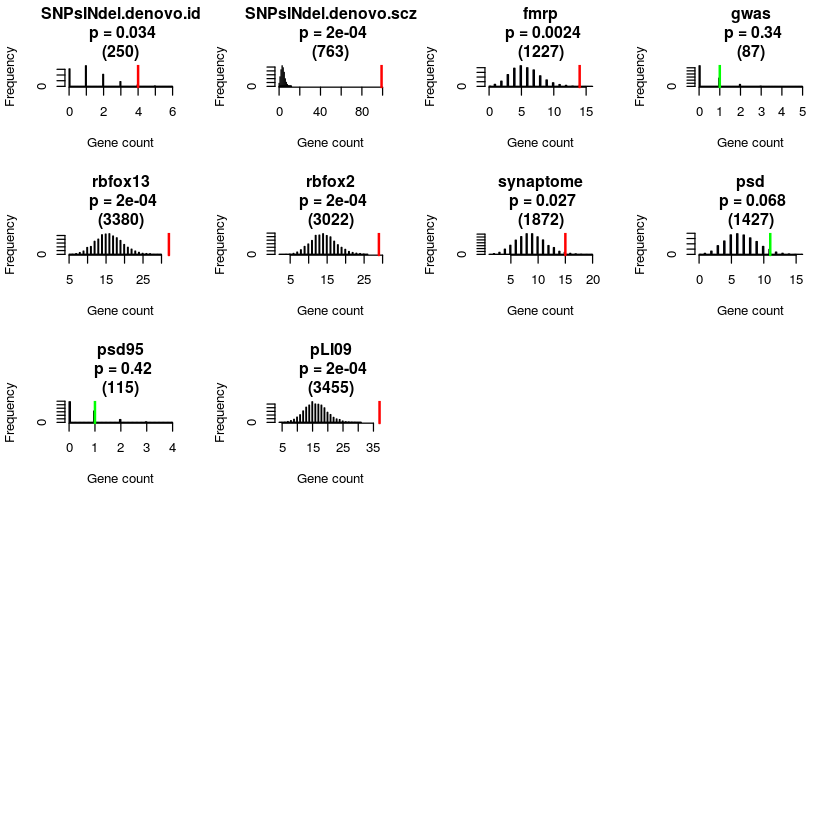

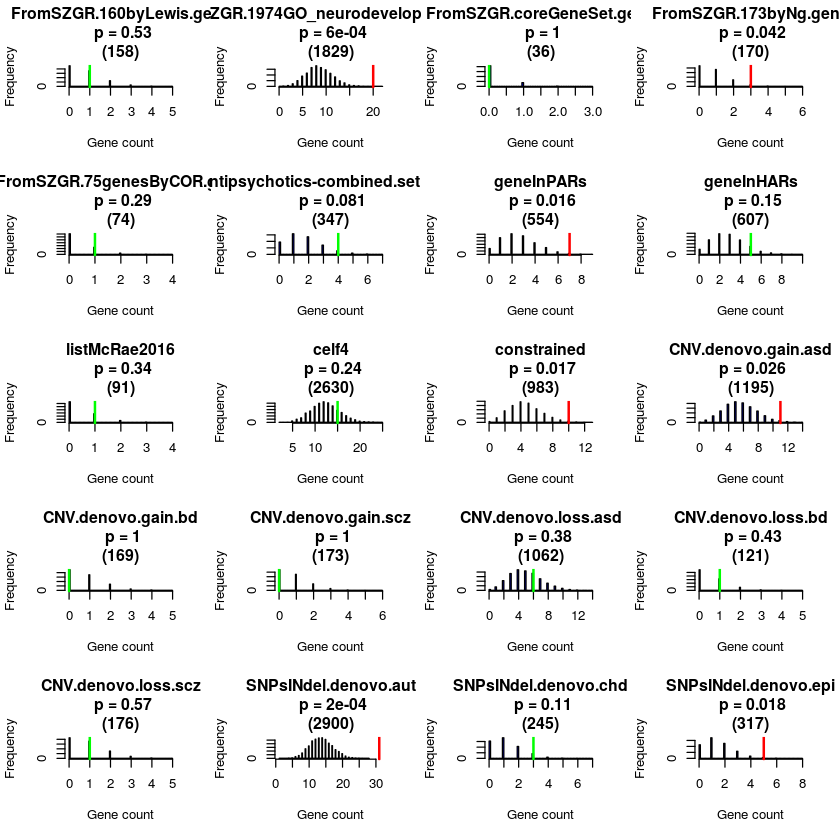

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData"


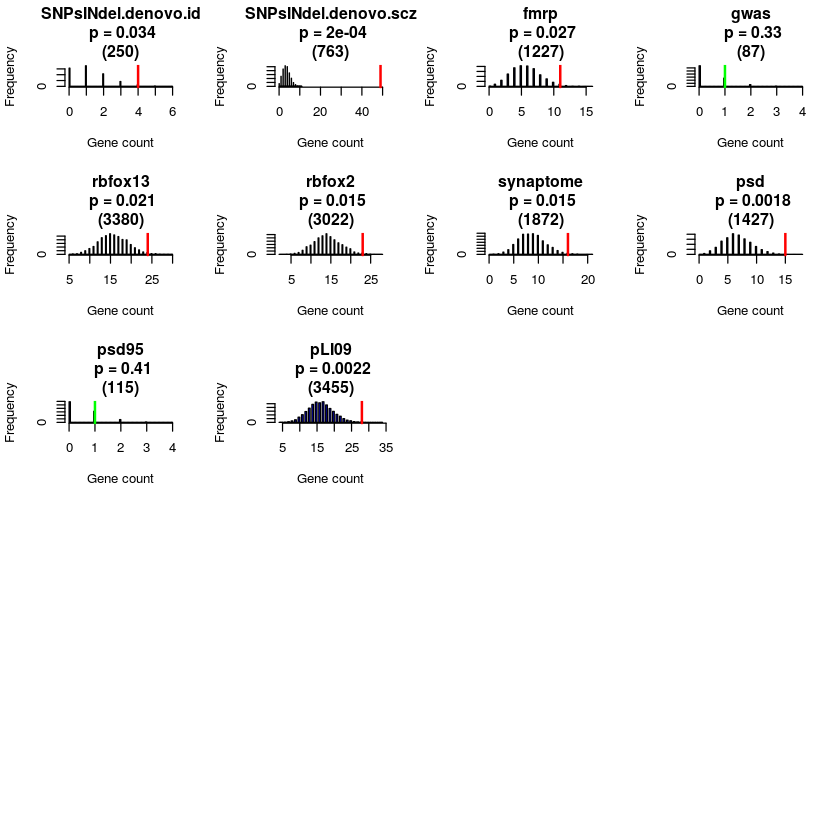

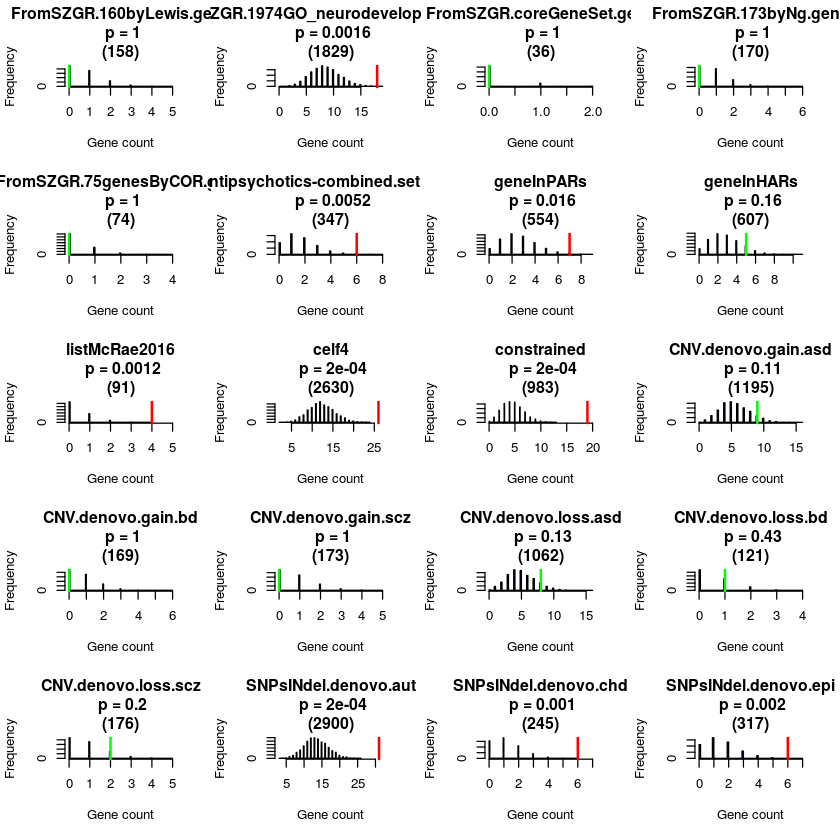

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData"


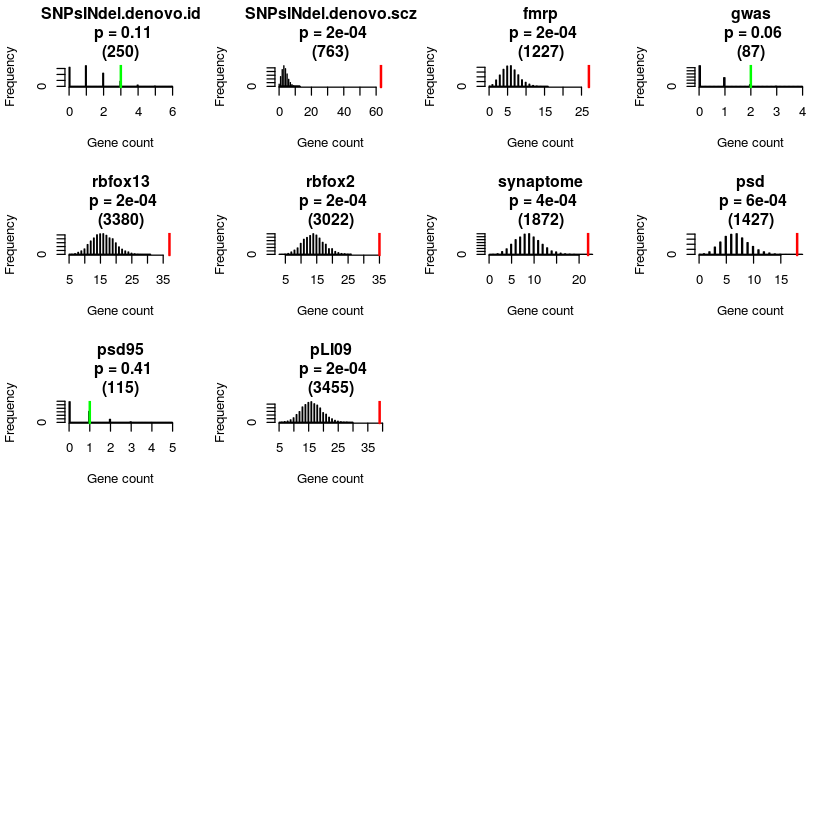

fileN,pList,pList,pList,pList
FromSZGR.160byLewis.gene,1,0.526694661067786,1,1
FromSZGR.1974GO_neurodevelopment.gene,0.0015996800639872,0.000599880023995201,0.0015996800639872,0.000399920015996801
FromSZGR.coreGeneSet.gene,1,1,1,1
FromSZGR.173byNg.gene,0.543291341731654,0.0421915616876625,1,0.550289942011598
FromSZGR.75genesByCOR.gene,1,0.290941811637672,1,1
antipsychotics-combined.set.gene,0.221755648870226,0.0807838432313537,0.00519896020795841,0.218356328734253
geneInPARs.txt,0.121375724855029,0.0155968806238752,0.0163967206558688,0.0445910817836433
geneInHARs.txt,0.318336332733453,0.150769846030794,0.160567886422715,0.778244351129774
listMcRae2016.txt,0.0021995600879824,0.343531293741252,0.0011997600479904,0.00699860027994401
celf4.txt,0.0013997200559888,0.239352129574085,0.0001999600079984,0.0171965606878624


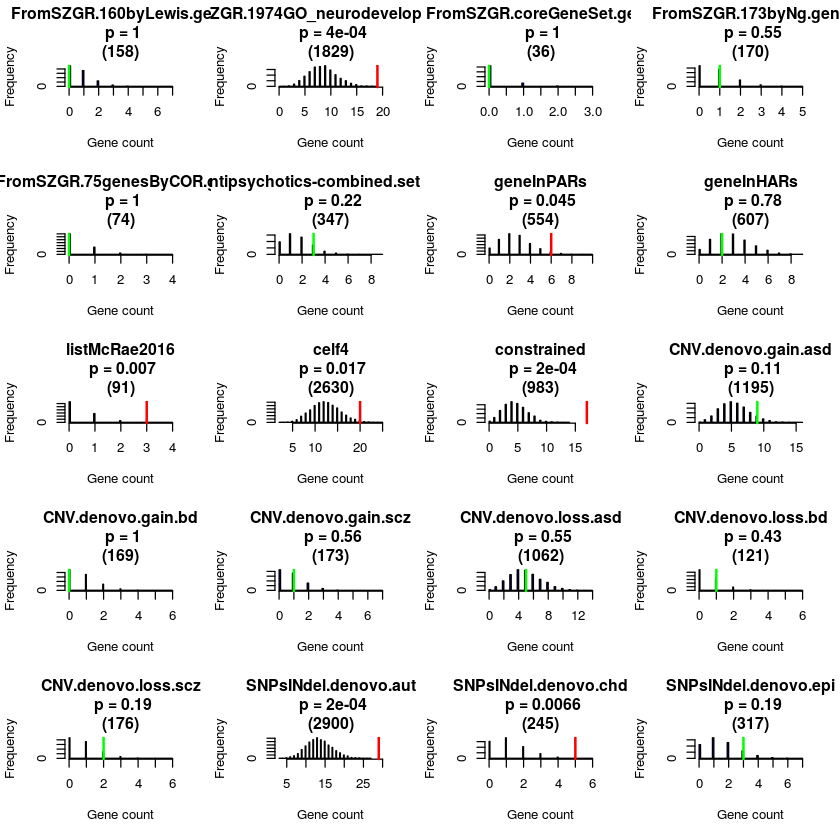

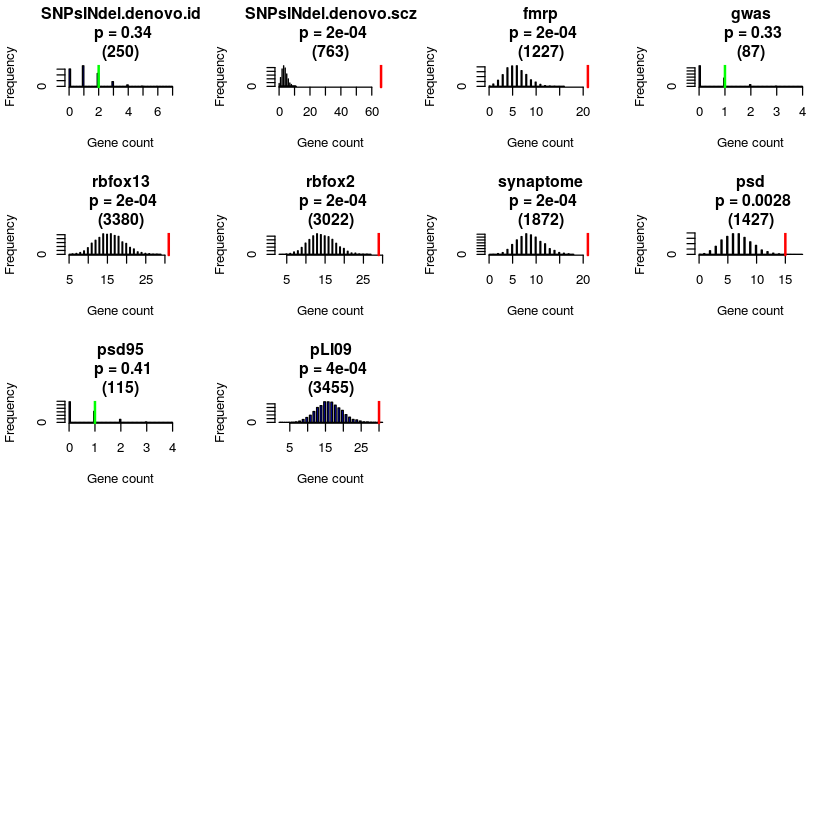

In [1]:
fileAll <- c("test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData",
    "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData",
            "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData",
        "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData")

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")

finalTable <- NULL

for (ii in 1:length(fileAll)){

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")
print(fileAll[ii])
allGeneList <- read.table(paste0("../data/FDR.oldBayesFactorCC.", fileAll[ii]), header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]

#sAll <- sAll[sAll[, 2] < 0.3, ]
sAll <- head(sAll, 100)
xResult <- as.character(sAll[, 1])

fileN <- c("FromSZGR.160byLewis.gene",
           "FromSZGR.1974GO_neurodevelopment.gene", "FromSZGR.coreGeneSet.gene",
           "FromSZGR.173byNg.gene", "FromSZGR.75genesByCOR.gene",
    "antipsychotics-combined.set.gene",
    "geneInPARs.txt",
           "geneInHARs.txt",
           "listMcRae2016.txt",
           "celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt", "pLI09.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL



par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 5000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

    if (pList[kk] < 0.05){
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'red', lwd = 2)
    
} else {
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'green', lwd = 2)
    }
    #########TEST all FDRs
  
}

    finalTable <- cbind(finalTable, pList)
#    pOutA <- data.frame(fileN, pList)
#pOutA <- pOutA[order(as.numeric(pOutA[, 2])), ]
#pOutA
    
    }

cbind(fileN, finalTable)

In [2]:
finalTable1 <- apply(finalTable, 2, function(x) signif(x,  2))
    
 colnames(finalTable1) <- paste0(gsub("lof_|Data", "", lapply(fileAll, 
                                    function(xy) unlist(strsplit(xy, ".", fixed = TRUE))[9])),
                                        "\nTop100")
b100 <- cbind(fileN, finalTable1)
b100

fileN,SingletonTransmitted Top100,SingletonTransmitted_noexac Top100,SingletonTransmittedAndCC_noexac Top100,SingletonTransmittedAndCC Top100
FromSZGR.160byLewis.gene,1,0.53,1,1
FromSZGR.1974GO_neurodevelopment.gene,0.0016,6e-04,0.0016,4e-04
FromSZGR.coreGeneSet.gene,1,1,1,1
FromSZGR.173byNg.gene,0.54,0.042,1,0.55
FromSZGR.75genesByCOR.gene,1,0.29,1,1
antipsychotics-combined.set.gene,0.22,0.081,0.0052,0.22
geneInPARs.txt,0.12,0.016,0.016,0.045
geneInHARs.txt,0.32,0.15,0.16,0.78
listMcRae2016.txt,0.0022,0.34,0.0012,0.007
celf4.txt,0.0014,0.24,2e-04,0.017


## FDR 0.3

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData"


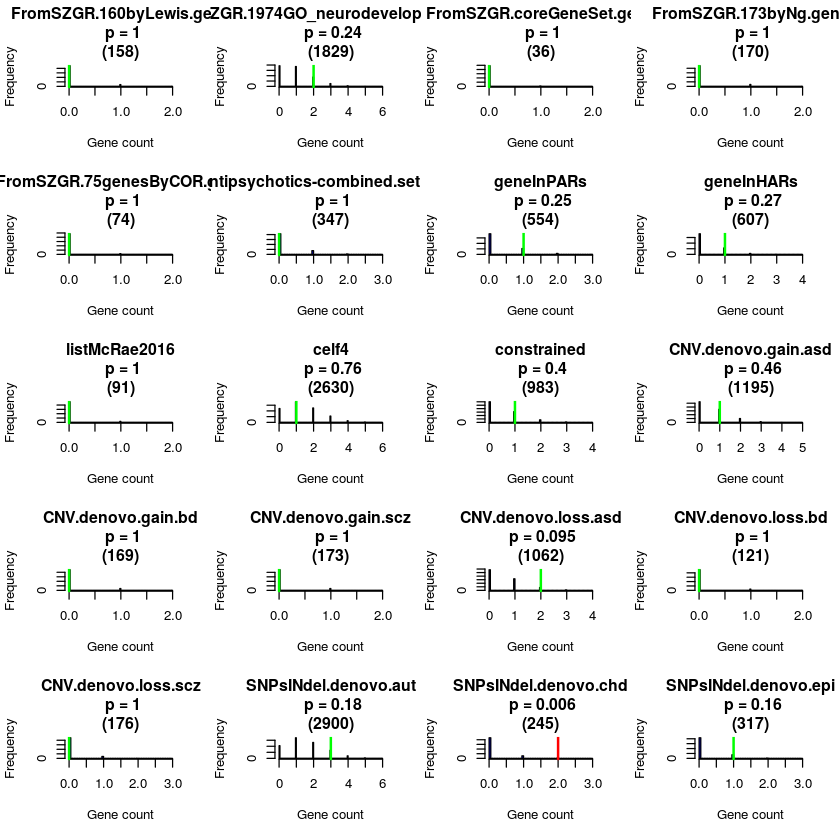

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData"


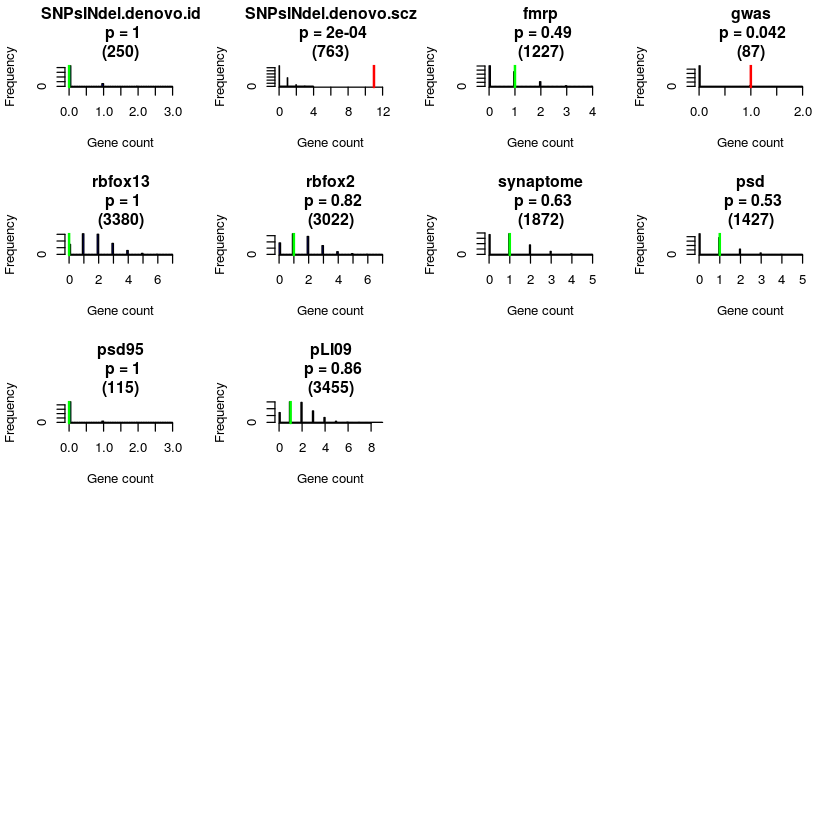

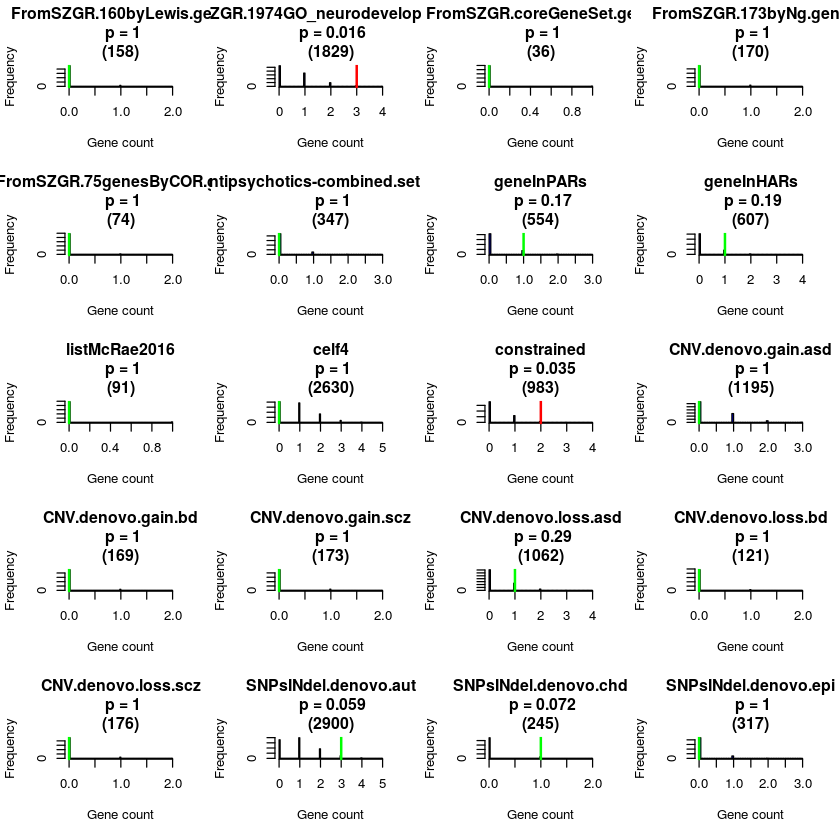

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData"


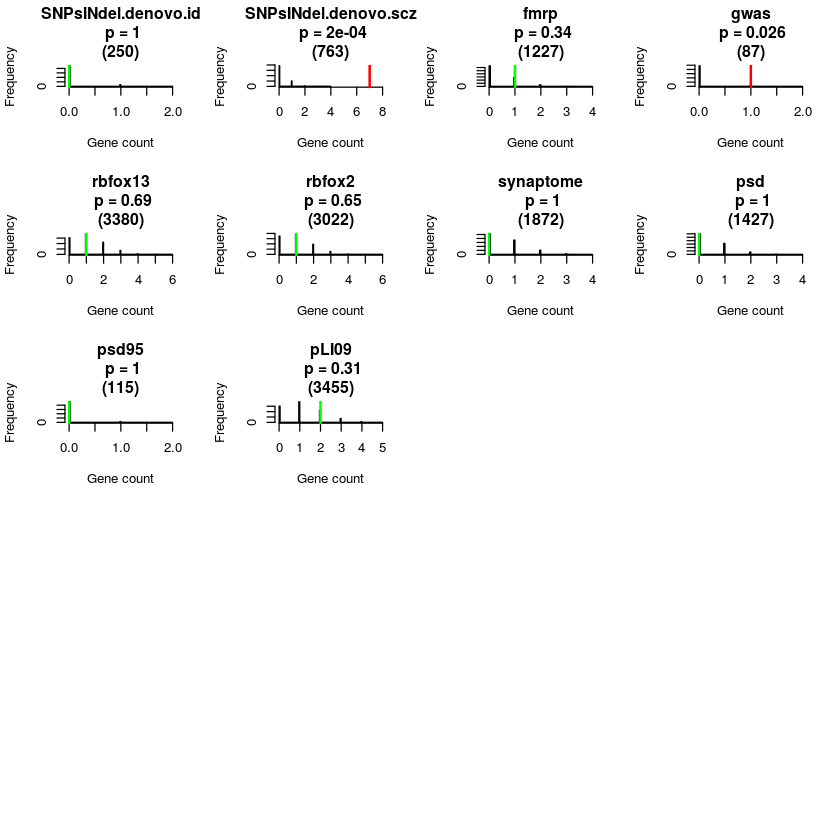

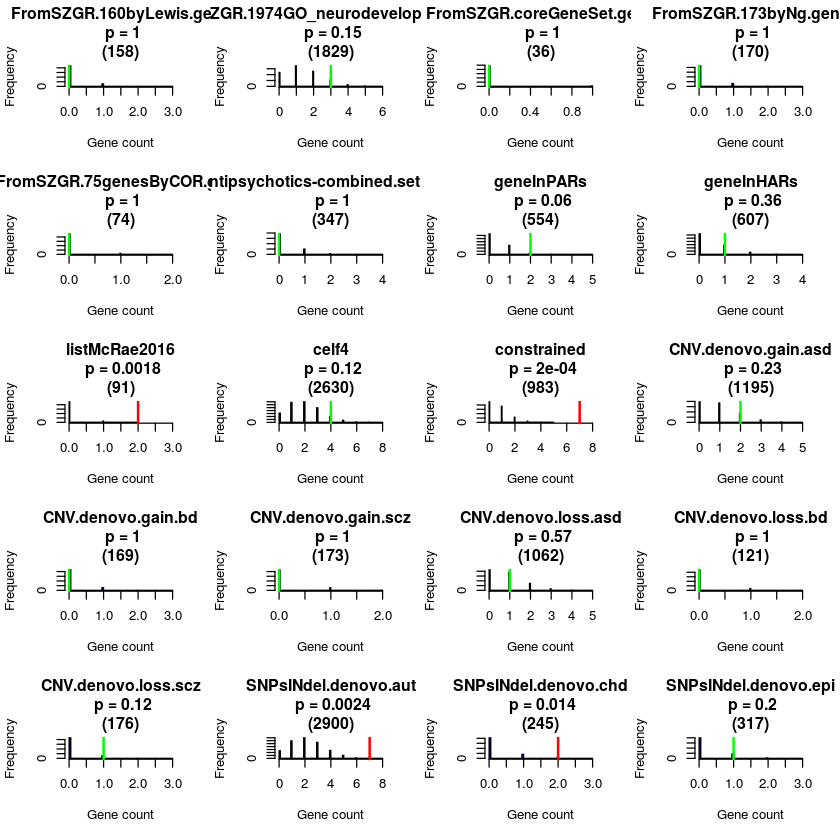

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData"


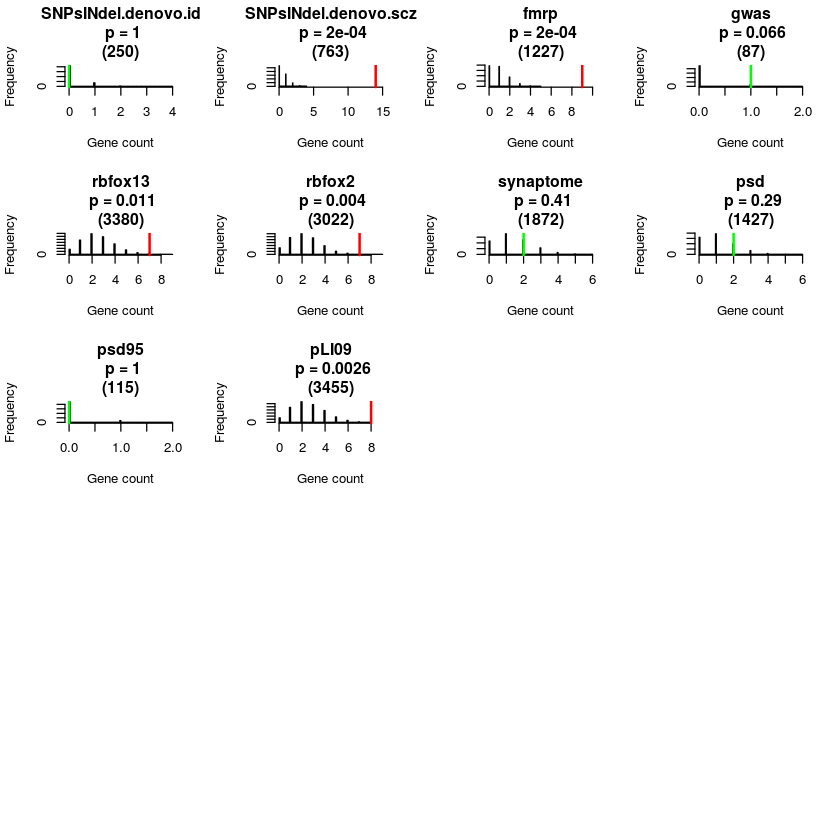

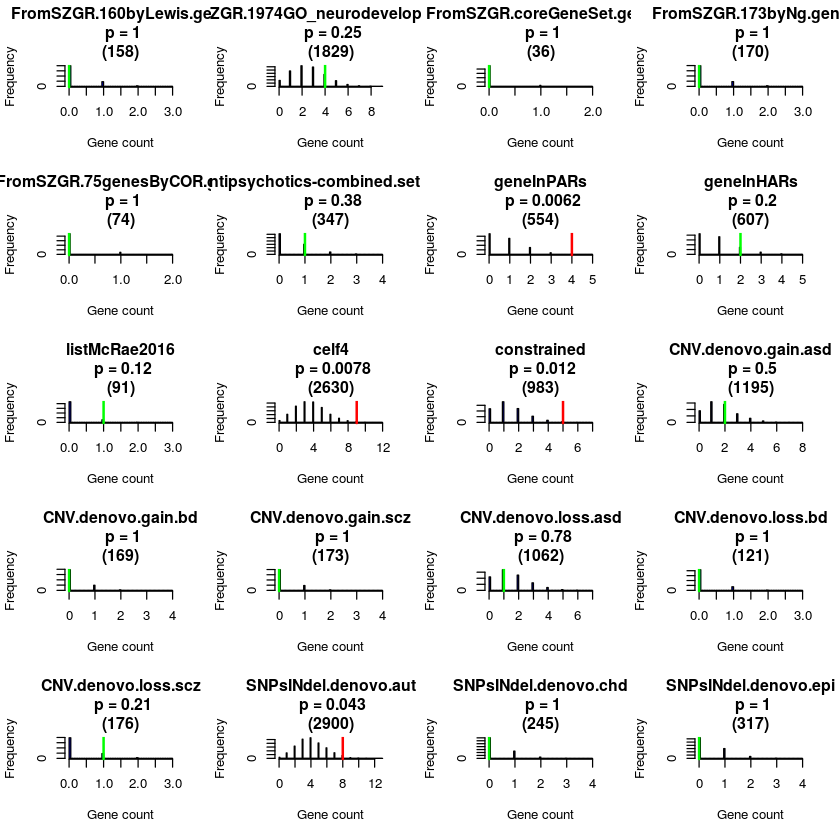

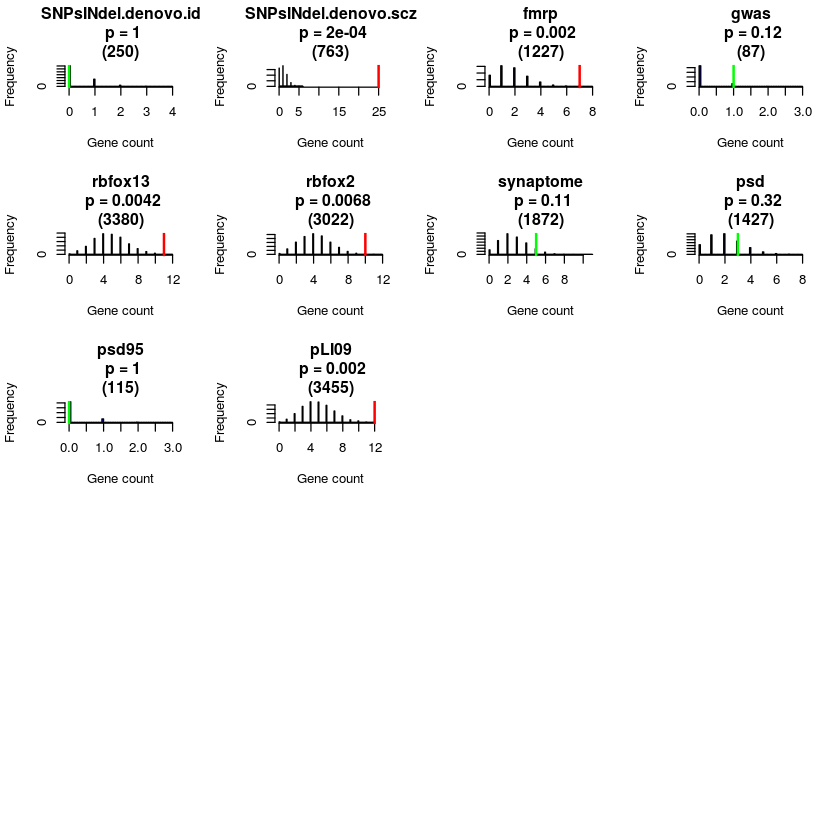

In [3]:
fileAll <- c("test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData",
    "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData",
            "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData",
        "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData")

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")

finalTableF03 <- NULL

for (ii in 1:length(fileAll)){

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")
print(fileAll[ii])
allGeneList <- read.table(paste0("../data/FDR.oldBayesFactorCC.", fileAll[ii]), header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]

sAll <- sAll[sAll[, 2] < 0.3, ]
#sAll <- head(sAll, 100)
xResult <- as.character(sAll[, 1])

fileN <- c("FromSZGR.160byLewis.gene",
           "FromSZGR.1974GO_neurodevelopment.gene", "FromSZGR.coreGeneSet.gene",
           "FromSZGR.173byNg.gene", "FromSZGR.75genesByCOR.gene",
    "antipsychotics-combined.set.gene",
    "geneInPARs.txt",
           "geneInHARs.txt",
           "listMcRae2016.txt",
           "celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt", "pLI09.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL



par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 5000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

    if (pList[kk] < 0.05){
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'red', lwd = 2)
    
} else {
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'green', lwd = 2)
    }
    #########TEST all FDRs
  
}

    finalTableF03 <- cbind(finalTableF03, pList)
#    pOutA <- data.frame(fileN, pList)
#pOutA <- pOutA[order(as.numeric(pOutA[, 2])), ]
#pOutA
    
    }



In [4]:
nTest <- dim(finalTable)[1]
nTest <- 1
finalTable1 <- apply(finalTable, 2, function(x) signif(x*nTest,  2))
b100 <- cbind(fileN, finalTable1)
#b100
    colnames(finalTable1) <- paste0("\\rotatebox{90}{",gsub("mitted|And|Singleton|_|lof_|Data", "", lapply(fileAll, 
                                    function(xy) unlist(strsplit(xy, ".", fixed = TRUE))[9])),
                                        "Top100}")
finalTable2 <- apply(finalTableF03, 2, function(x) signif(x*nTest,  2))
    
    colnames(finalTable2) <- paste0("\\rotatebox{90}{", gsub("mitted|mittedAnd|And|Singleton|_|lof_|Data", "", lapply(fileAll, 
                                    function(xy) unlist(strsplit(xy, ".", fixed = TRUE))[9])),
                                        "(FDR0.3)}")
bF03 <- cbind(fileN, finalTable2)
#bF03
      
bAll <- cbind(fileN, finalTable1, finalTable2)
colnames(bAll)[1] <- "Gene set"
 bAll               
write.table(bAll, paste0("../data/resultsGeneSet2ClassesFromBayesFactor.txt"), sep = " & ", row.names = FALSE, quote = FALSE)

Gene set,\rotatebox{90}{TransTop100},\rotatebox{90}{TransnoexacTop100},\rotatebox{90}{TransCCnoexacTop100},\rotatebox{90}{TransCCTop100},\rotatebox{90}{Trans(FDR0.3)},\rotatebox{90}{Transnoexac(FDR0.3)},\rotatebox{90}{TransCCnoexac(FDR0.3)},\rotatebox{90}{TransCC(FDR0.3)}
FromSZGR.160byLewis.gene,1,0.53,1,1,1,1,1,1
FromSZGR.1974GO_neurodevelopment.gene,0.0016,6e-04,0.0016,4e-04,0.24,0.016,0.15,0.25
FromSZGR.coreGeneSet.gene,1,1,1,1,1,1,1,1
FromSZGR.173byNg.gene,0.54,0.042,1,0.55,1,1,1,1
FromSZGR.75genesByCOR.gene,1,0.29,1,1,1,1,1,1
antipsychotics-combined.set.gene,0.22,0.081,0.0052,0.22,1,1,1,0.38
geneInPARs.txt,0.12,0.016,0.016,0.045,0.25,0.17,0.06,0.0062
geneInHARs.txt,0.32,0.15,0.16,0.78,0.27,0.19,0.36,0.2
listMcRae2016.txt,0.0022,0.34,0.0012,0.007,1,1,0.0018,0.12
celf4.txt,0.0014,0.24,2e-04,0.017,0.76,1,0.12,0.0078


In [5]:
 bAll[bAll[, dim(bAll)[2]] < 0.05, ][, c(1, dim(bAll)[2])]

Gene set,\rotatebox{90}{TransCC(FDR0.3)}
geneInPARs.txt,0.0062
celf4.txt,0.0078
constrained.txt,0.012
SNPsINdel.denovo.aut.txt,0.043
fmrp.txt,0.002
rbfox13.txt,0.0042
rbfox2.txt,0.0068
pLI09.txt,0.002


## Correct p use "BH" method

In [10]:
b2 <- bAll[, dim(bAll)[2]]
names(b2) <- bAll[, 1]
b3 <- p.adjust(b2, method = "BH")
b23 <- cbind(b2, b3)

b23[order(b23[, 2]),]
#pLI09: haplo-insufficient gene list

,b2,b3
SNPsINdel.denovo.scz.txt,2e-04,0.006
fmrp.txt,0.002,0.02
pLI09.txt,0.002,0.02
rbfox13.txt,0.0042,0.0315
geneInPARs.txt,0.0062,0.0334285714285714
celf4.txt,0.0078,0.0334285714285714
rbfox2.txt,0.0068,0.0334285714285714
constrained.txt,0.012,0.045
SNPsINdel.denovo.aut.txt,0.043,0.143333333333333
listMcRae2016.txt,0.12,0.3


## De novo + Transmitted

In [1]:
fileAll <- c("test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData",
    "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData",
            "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData",
        "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData")


xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")

allGeneList <- read.table(paste0("../data/FDR.oldBayesFactorCC.", fileAll[1]), header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]

xResult <- as.character(head(sAll, 100)[, 1])
length(xResult)
head(sAll)

[1] 100

,Gene,qvalue
1,MKI67,0.07001358
2,TAF13,0.09226458
3,SETD1A,0.1230569
4,DPYD,0.143037
5,DNAH9,0.1785821
6,RTTN,0.2028654


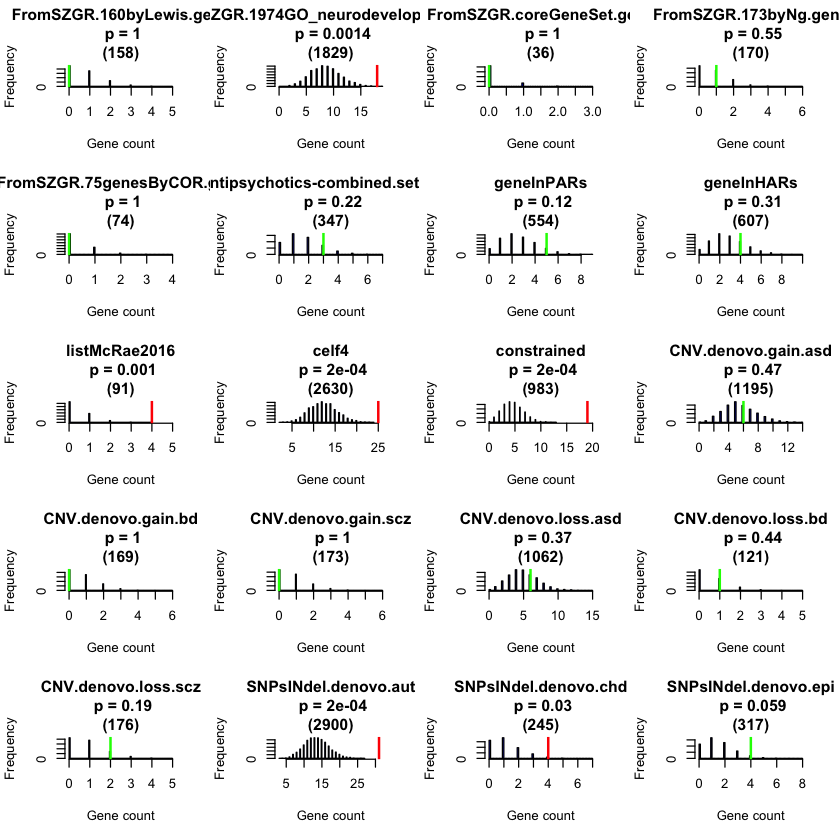

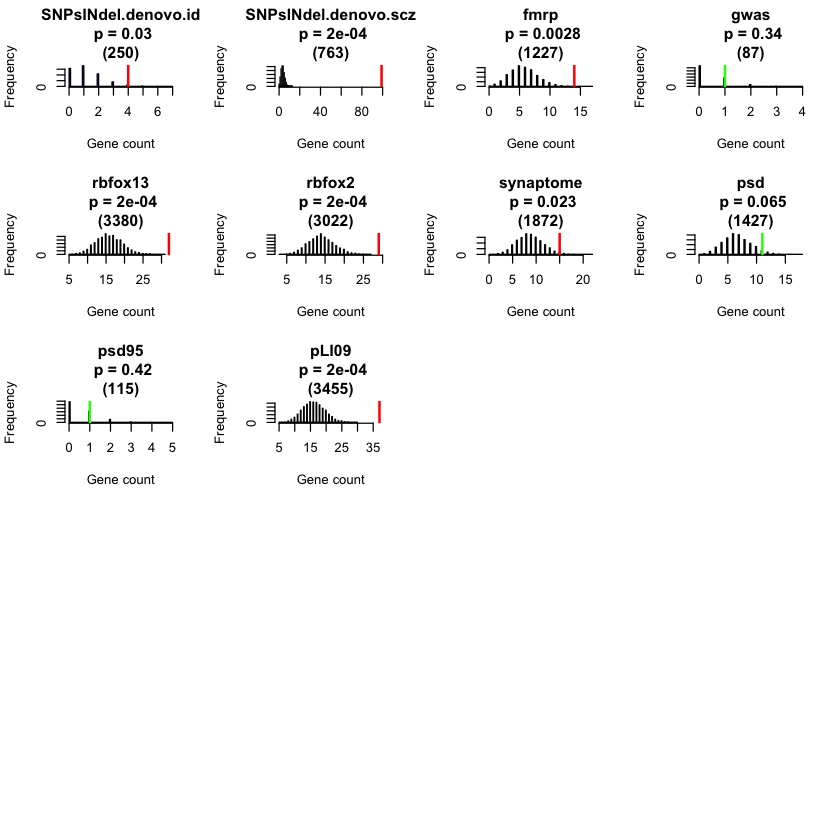

In [2]:
fileN <- c("FromSZGR.160byLewis.gene",
           "FromSZGR.1974GO_neurodevelopment.gene", "FromSZGR.coreGeneSet.gene",
           "FromSZGR.173byNg.gene", "FromSZGR.75genesByCOR.gene",
    "antipsychotics-combined.set.gene",
    "geneInPARs.txt",
           "geneInHARs.txt",
           "listMcRae2016.txt",
           "celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt", "pLI09.txt")
pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL

par(mfrow = c(5, 4))

for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 5000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

#    1- pnorm(xIntersect, mean(outList), sd = sd(outList))
if (pList[kk] < 0.05){
    hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'red', lwd = 2)
    
} else {
        hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    
    abline(v = xIntersect, col = 'green', lwd = 2)
    }
    #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
xT <- cbind(xFMRP, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])

#pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
}


In [3]:
pOutA <- data.frame(fileN, pList)
pOutA <- pOutA[order(as.numeric(pOutA[, 2])), ]
pOutA

,fileN,pList
10,celf4.txt,0.00019996
11,constrained.txt,0.00019996
18,SNPsINdel.denovo.aut.txt,0.00019996
22,SNPsINdel.denovo.scz.txt,0.00019996
25,rbfox13.txt,0.00019996
26,rbfox2.txt,0.00019996
30,pLI09.txt,0.00019996
9,listMcRae2016.txt,0.0009998
2,FromSZGR.1974GO_neurodevelopment.gene,0.00139972
23,fmrp.txt,0.00279944


## De novo + CC + Transmitted

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData"


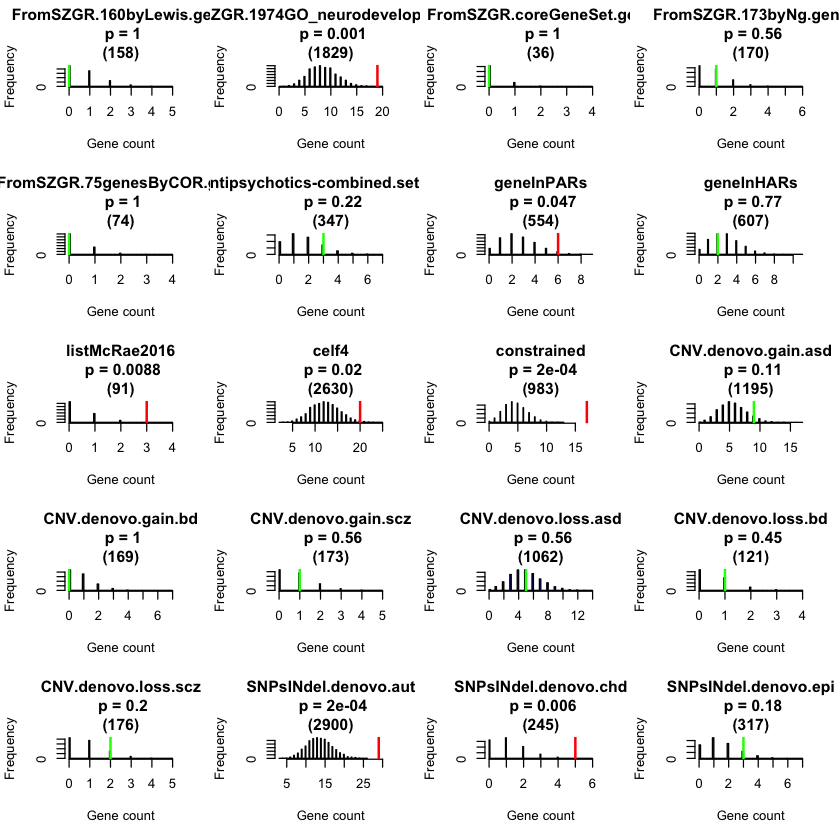

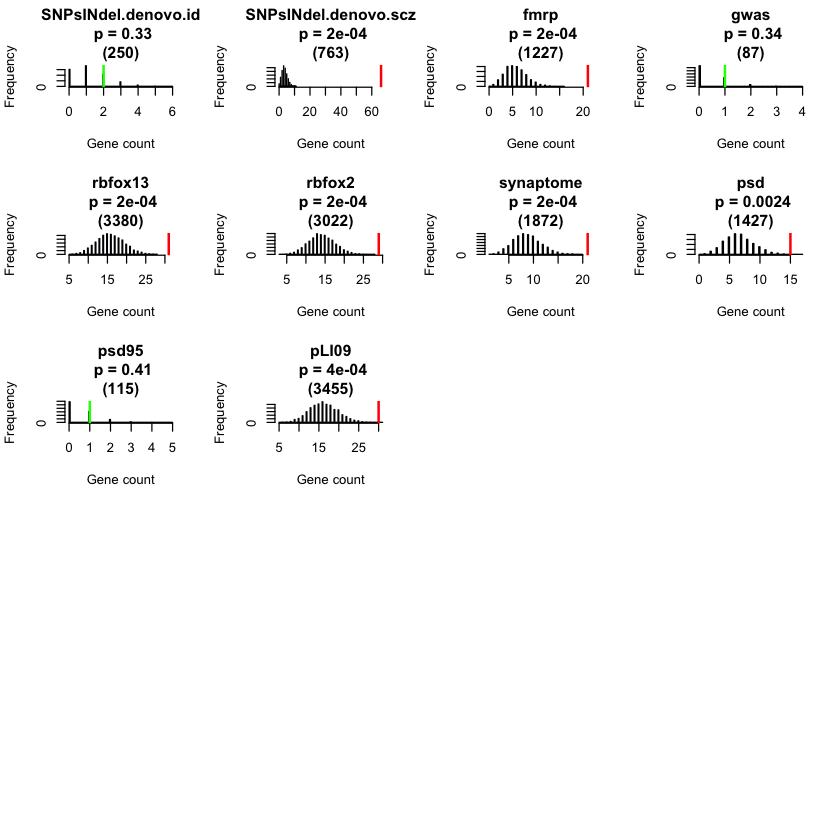

In [6]:
ii = 4
xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")
print(fileAll[ii])
allGeneList <- read.table(paste0("../data/FDR.oldBayesFactorCC.", fileAll[ii]), header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]

#sAll <- sAll[sAll[, 2] < 0.3, ]
sAll <- head(sAll, 100)
xResult <- as.character(sAll[, 1])

fileN <- c("FromSZGR.160byLewis.gene",
           "FromSZGR.1974GO_neurodevelopment.gene", "FromSZGR.coreGeneSet.gene",
           "FromSZGR.173byNg.gene", "FromSZGR.75genesByCOR.gene",
    "antipsychotics-combined.set.gene",
    "geneInPARs.txt",
           "geneInHARs.txt",
           "listMcRae2016.txt",
           "celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt", "pLI09.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL



par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 5000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

    if (pList[kk] < 0.05){
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'red', lwd = 2)
    
} else {
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'green', lwd = 2)
    }
    #########TEST all FDRs
  
}


In [7]:
pOutA <- data.frame(fileN, pList)
pOutA <- pOutA[order(as.numeric(pOutA[, 2])), ]
pOutA

,fileN,pList
11,constrained.txt,0.00019996
18,SNPsINdel.denovo.aut.txt,0.00019996
22,SNPsINdel.denovo.scz.txt,0.00019996
23,fmrp.txt,0.00019996
25,rbfox13.txt,0.00019996
26,rbfox2.txt,0.00019996
27,synaptome.txt,0.00019996
30,pLI09.txt,0.00039992
2,FromSZGR.1974GO_neurodevelopment.gene,0.0009998
28,psd.txt,0.00239952


## De novo + Transmitted + NoExac SingletonTransmittedData_noexac

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData"


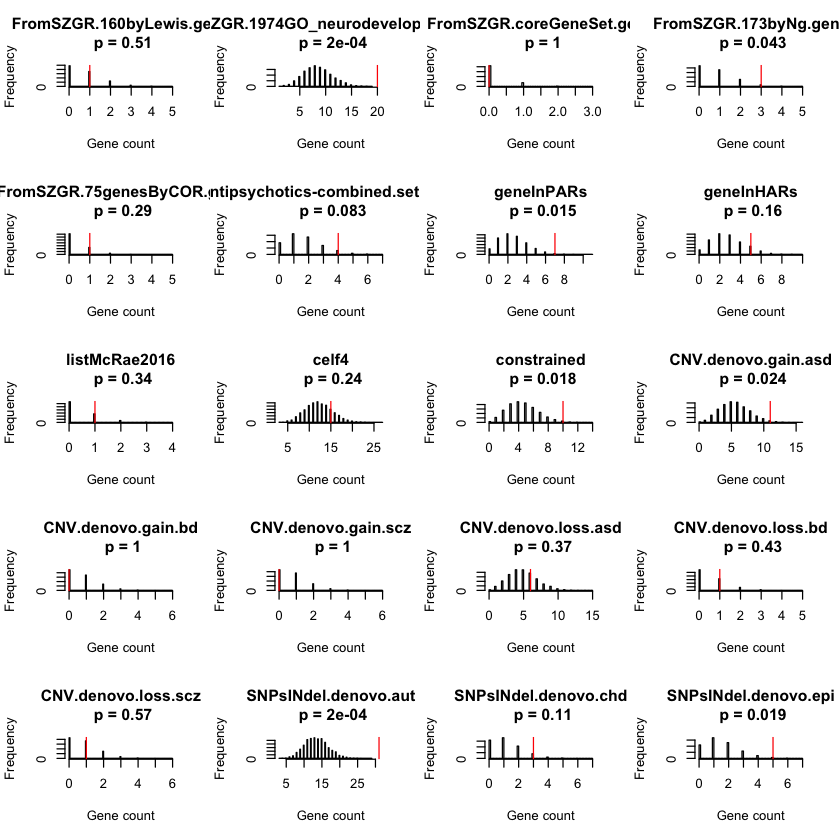

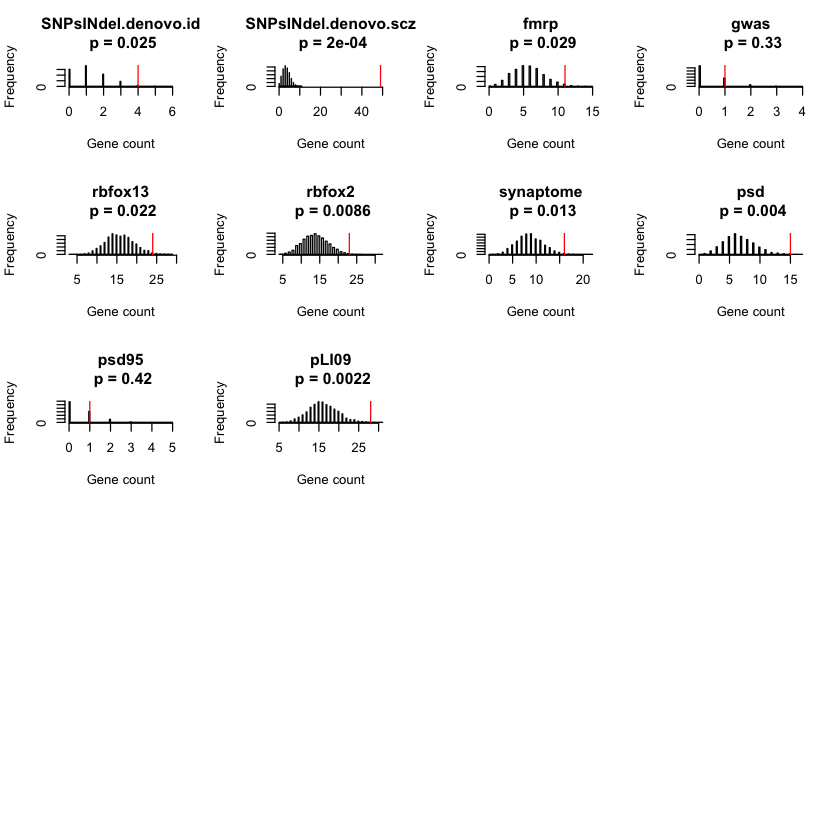

In [10]:
ii = 2

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")
print(fileAll[ii])
allGeneList <- read.table(paste0("../data/FDR.oldBayesFactorCC.", fileAll[ii]), header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]
#sAll <- sAll[sAll[, 2] < 0.3, ]
sAll <- head(sAll, 100)
xResult <- as.character(sAll[, 1])

fileN <- c("FromSZGR.160byLewis.gene",
           "FromSZGR.1974GO_neurodevelopment.gene", "FromSZGR.coreGeneSet.gene",
           "FromSZGR.173byNg.gene", "FromSZGR.75genesByCOR.gene",
    "antipsychotics-combined.set.gene",
    "geneInPARs.txt",
           "geneInHARs.txt",
           "listMcRae2016.txt",
           "celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt", "pLI09.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL

par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 5000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

#    1- pnorm(xIntersect, mean(outList), sd = sd(outList))

    hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]), "\n p = ", signif(pList[kk], 2), sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count")
    abline(v = xIntersect, col = 'red')
    
   

}


## De novo + Transmitted + CC + NOEXAC

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData"


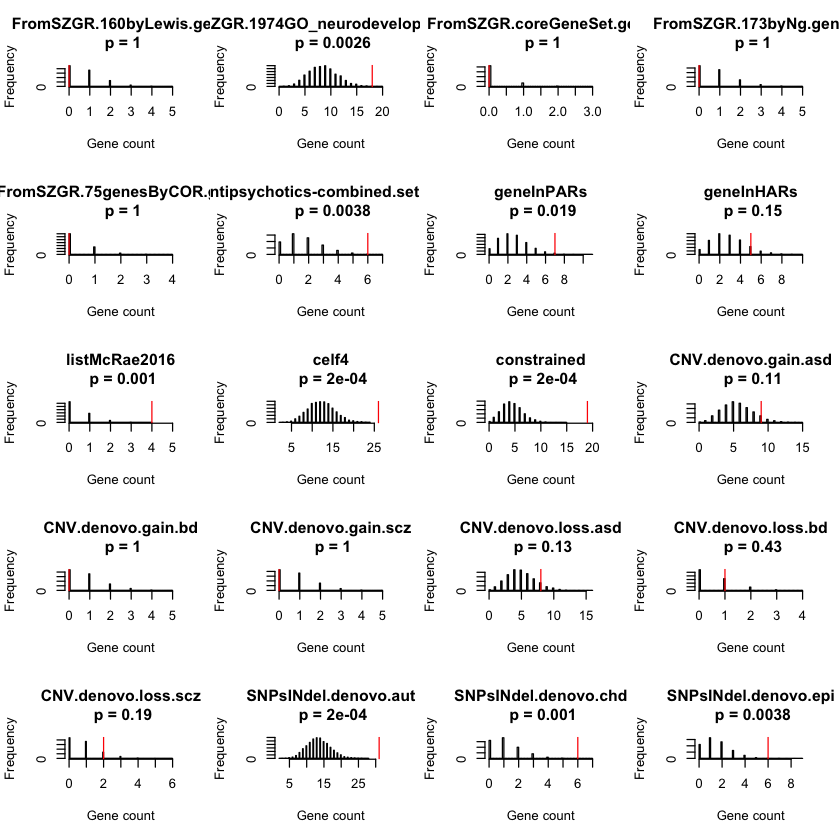

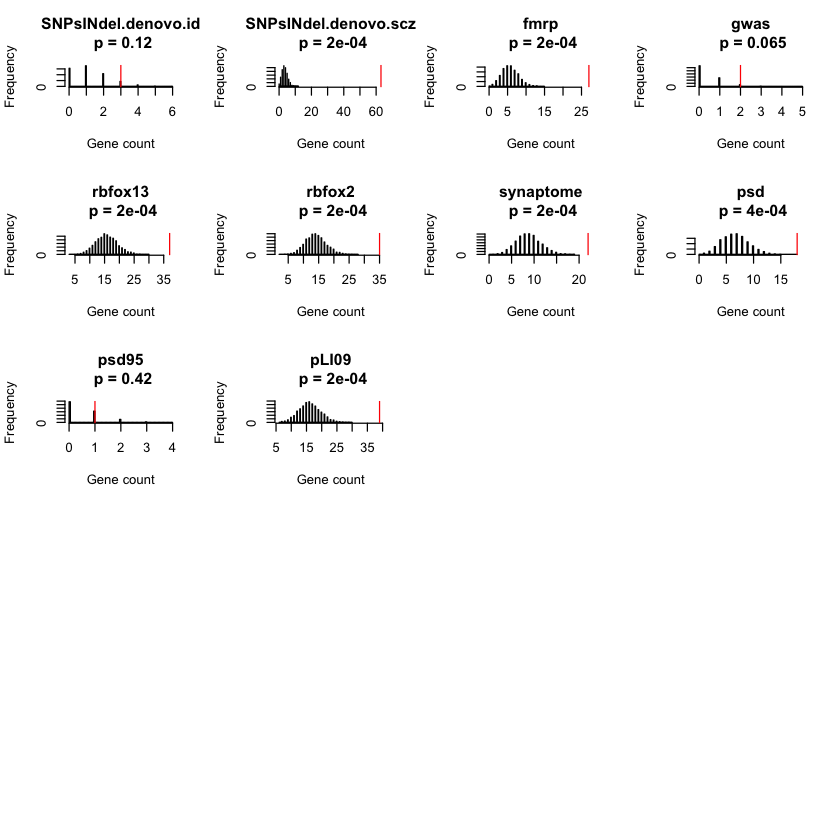

In [13]:
ii = 3

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")
print(fileAll[ii])
allGeneList <- read.table(paste0("../data/FDR.oldBayesFactorCC.", fileAll[ii]), header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]
#sAll <- sAll[sAll[, 2] < 0.3, ]
sAll <- head(sAll, 100)
xResult <- as.character(sAll[, 1])

fileN <- c("FromSZGR.160byLewis.gene",
           "FromSZGR.1974GO_neurodevelopment.gene", "FromSZGR.coreGeneSet.gene",
           "FromSZGR.173byNg.gene", "FromSZGR.75genesByCOR.gene",
    "antipsychotics-combined.set.gene",
    "geneInPARs.txt",
           "geneInHARs.txt",
           "listMcRae2016.txt",
           "celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt", "pLI09.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL

par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 5000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

#    1- pnorm(xIntersect, mean(outList), sd = sd(outList))

    hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]), "\n p = ", signif(pList[kk], 2), sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count")
    abline(v = xIntersect, col = 'red')
    
   

}


## De novo + Transmitted + CC + NOEXAC

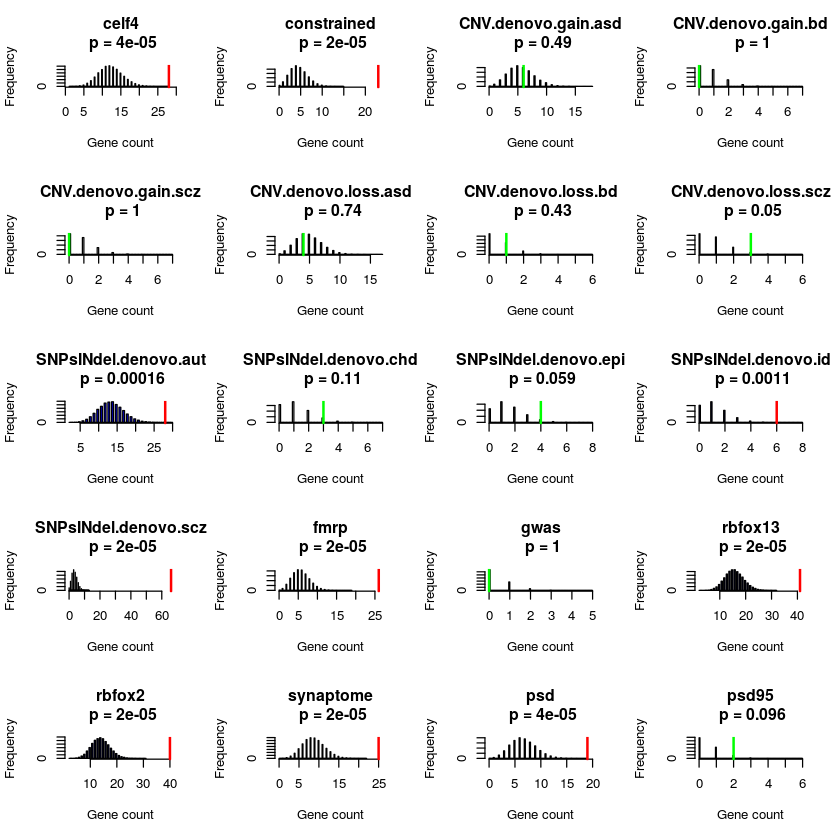

In [1]:

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")

allGeneList <- read.table("../data/FDR.test_rstan_2016.Pio.4.nIteration10000.nThin.10.index.11_25_Apr_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.notChangeBetas.RData", header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]
xResult <- as.character(head(sAll, 100)[, 1])

fileN <- c("celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL



par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

#    1- pnorm(xIntersect, mean(outList), sd = sd(outList))

    if (pList[kk] < 0.05){
    hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]), "\n p = ", signif(pList[kk], 2), sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'red', lwd = 2)
    
} else {
    hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]), "\n p = ", signif(pList[kk], 2), sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count")
    
    abline(v = xIntersect, col = 'green', lwd = 2)
    }
    
    #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
xT <- cbind(xFMRP, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])

pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
}


## De novo + CC + NOEXAC

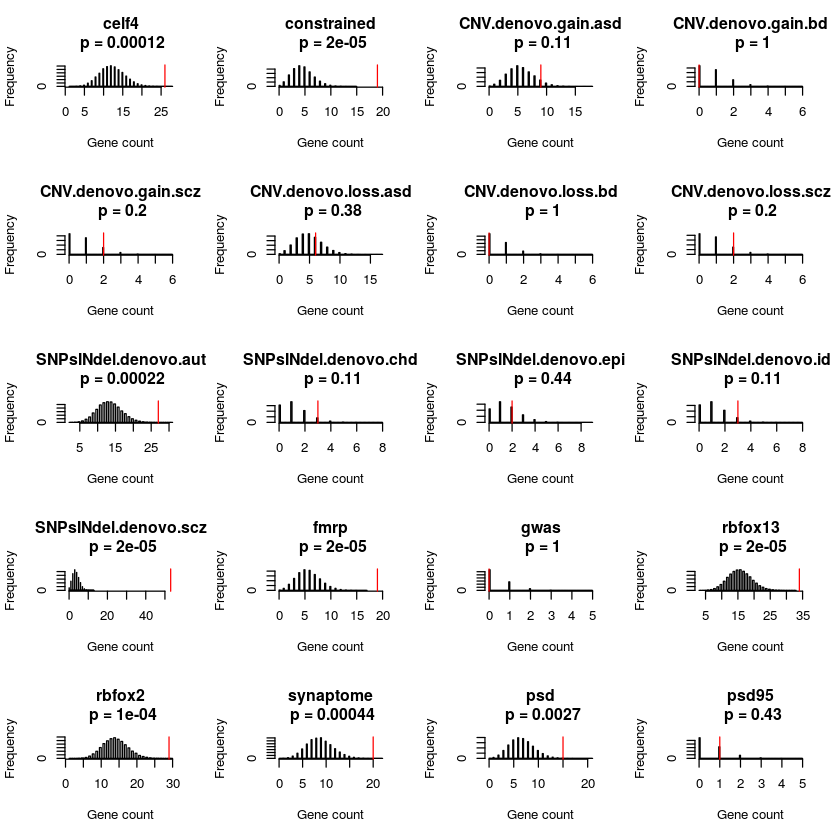

In [7]:

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")

allGeneList <- read.table("../data/FDR.test_rstan_2016.Pio.4.nIteration10000.nThin.10.index.22_00_Apr_26_2016.lof_Singleton_noexac.damaging_Singleton_noexac.adjustBetasAsFunction.RData", header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]
xResult <- as.character(head(sAll, 100)[, 1])
fileN <- c("celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL

par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

#    1- pnorm(xIntersect, mean(outList), sd = sd(outList))

    hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]), "\n p = ", signif(pList[kk], 2), sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count")
    abline(v = xIntersect, col = 'red')
    
    #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
xT <- cbind(xFMRP, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])

pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
}

